<a href="https://colab.research.google.com/github/FrankStein31/PCVK_244107027008_Frankie-Steinlie/blob/main/PVCK_Frankie_Steinlie_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**NIM : 244107027008**

**Nama : Frankie Steinlie**

Mata Kuliah : Pengolahan Citra dan Visi Komputer

Proyek : Deteksi Motor dan Mobil

In [ ]:
!pip install ultralytics
!pip install supervision

!yolo task=detect mode=train model=yolov8n.pt data=coco128.yaml epochs=1 imgsz=640

Ultralytics 8.3.15 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=coco128.yaml, epochs=1, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width

In [3]:
!pip install --upgrade ultralytics supervision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 876.6/876.6 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.2/158.2 kB 11.9 MB/s eta 0:00:00



0: 448x640 54 cars, 1 bus, 283.5ms
Speed: 4.6ms preprocess, 283.5ms inference, 2.3ms postprocess per image at shape (1, 3, 448, 640)


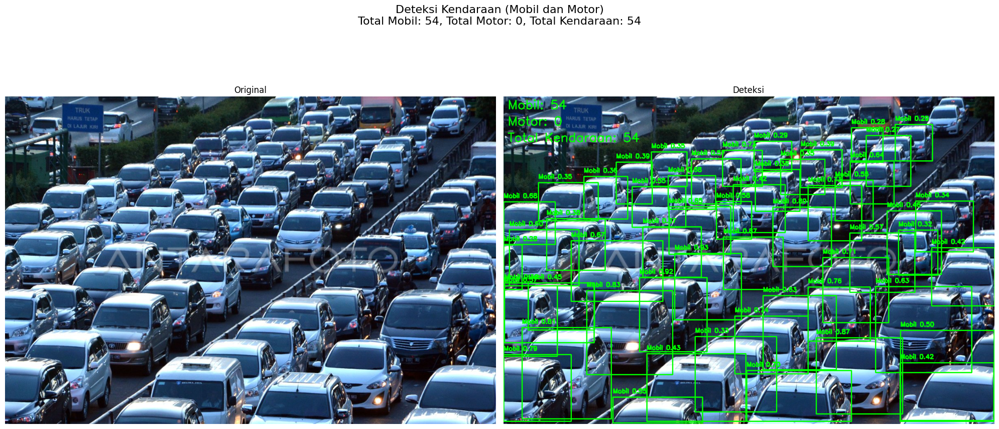


Hasil Deteksi:
Total Mobil: 54
Total Motor: 0
Total Kendaraan: 54


In [11]:
import torch
import os
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

model = YOLO('yolov8n.pt')

def get_red_color():
    return (0, 0, 255)

def detect_vehicles(image_path):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Gagal membaca gambar {image_path}")

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Run inference
    results = model(image_rgb)[0]  # Get only the first result

    # Initialize counters
    total_cars = 0
    total_motorcycles = 0

    # Copy image for annotation
    annotated_image = image_rgb.copy()

    # Process each detection
    for box in results.boxes:
        # Get box coordinates
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

        # Get class_id and confidence
        class_id = int(box.cls.cpu().numpy()[0])
        conf = float(box.conf.cpu().numpy()[0])

        # If detection is a car (class 2)
        if class_id == 2:
            total_cars += 1
            cv2.rectangle(annotated_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(annotated_image, f'Mobil {conf:.2f}',
                        (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # If detection is a motorcycle (class 3)
        elif class_id == 3:
            total_motorcycles += 1
            cv2.rectangle(annotated_image, (x1, y1), (x2, y2), (255, 0, 0), 2)
            cv2.putText(annotated_image, f'Motor {conf:.2f}',
                        (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # Add statistics to the image
    cv2.putText(annotated_image, f"Mobil: {total_cars}", (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
    cv2.putText(annotated_image, f"Motor: {total_motorcycles}", (10, 70),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
    cv2.putText(annotated_image, f"Total Kendaraan: {total_cars + total_motorcycles}", (10, 110),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

    return image_rgb, annotated_image, total_cars, total_motorcycles

def display_results(original_image, annotated_image, total_cars, total_motorcycles):
    # Create a figure with two subplots side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    # Display original image
    ax1.imshow(original_image)
    ax1.set_title("Original")
    ax1.axis('off')

    # Display annotated image
    ax2.imshow(annotated_image)
    ax2.set_title("Deteksi")
    ax2.axis('off')

    # Add overall title with statistics
    plt.suptitle(f"Deteksi Kendaraan (Mobil dan Motor)\nTotal Mobil: {total_cars}, Total Motor: {total_motorcycles}, Total Kendaraan: {total_cars + total_motorcycles}", fontsize=16)

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Image path
    image_path = '/content/drive/MyDrive/PCVK/Project/foto_mobil.jpg'

    try:
        # Process detection
        original_image, annotated_image, total_cars, total_motorcycles = detect_vehicles(image_path)

        # Display results
        display_results(original_image, annotated_image, total_cars, total_motorcycles)

        # Print detection results
        print("\nHasil Deteksi:")
        print(f"Total Mobil: {total_cars}")
        print(f"Total Motor: {total_motorcycles}")
        print(f"Total Kendaraan: {total_cars + total_motorcycles}")

    except Exception as e:
        print(f"Error in processing the image: {str(e)}")


0: 448x640 10 persons, 2 cars, 9 motorcycles, 1 traffic light, 814.6ms
Speed: 4.2ms preprocess, 814.6ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


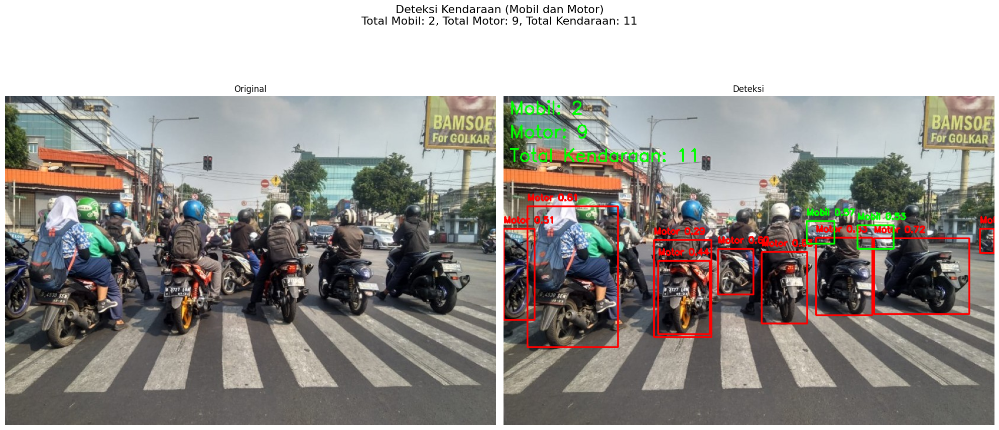


Hasil Deteksi:
Total Mobil: 2
Total Motor: 9
Total Kendaraan: 11


In [12]:
if __name__ == "__main__":
    # Image path
    image_path = '/content/drive/MyDrive/PCVK/Project/foto_motor.jpg'

    try:
        # Process detection
        original_image, annotated_image, total_cars, total_motorcycles = detect_vehicles(image_path)

        # Display results
        display_results(original_image, annotated_image, total_cars, total_motorcycles)

        # Print detection results
        print("\nHasil Deteksi:")
        print(f"Total Mobil: {total_cars}")
        print(f"Total Motor: {total_motorcycles}")
        print(f"Total Kendaraan: {total_cars + total_motorcycles}")

    except Exception as e:
        print(f"Error in processing the image: {str(e)}")


0: 448x640 4 persons, 23 cars, 2 traffic lights, 187.4ms
Speed: 6.1ms preprocess, 187.4ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


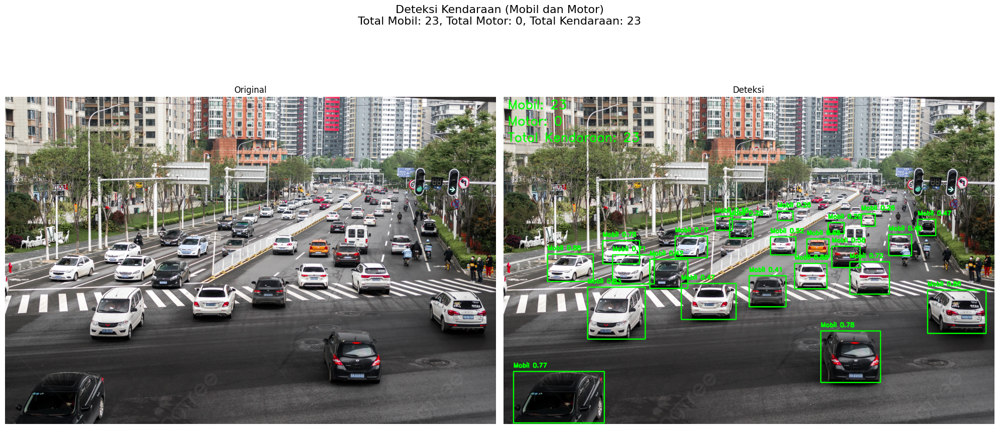


Hasil Deteksi:
Total Mobil: 23
Total Motor: 0
Total Kendaraan: 23


In [13]:
if __name__ == "__main__":
    # Image path
    image_path = '/content/drive/MyDrive/PCVK/Project/foto_mobil2.jpg'

    try:
        # Process detection
        original_image, annotated_image, total_cars, total_motorcycles = detect_vehicles(image_path)

        # Display results
        display_results(original_image, annotated_image, total_cars, total_motorcycles)

        # Print detection results
        print("\nHasil Deteksi:")
        print(f"Total Mobil: {total_cars}")
        print(f"Total Motor: {total_motorcycles}")
        print(f"Total Kendaraan: {total_cars + total_motorcycles}")

    except Exception as e:
        print(f"Error in processing the image: {str(e)}")


0: 480x640 9 persons, 12 cars, 7 motorcycles, 4 buss, 4 trucks, 1 umbrella, 171.1ms
Speed: 4.5ms preprocess, 171.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


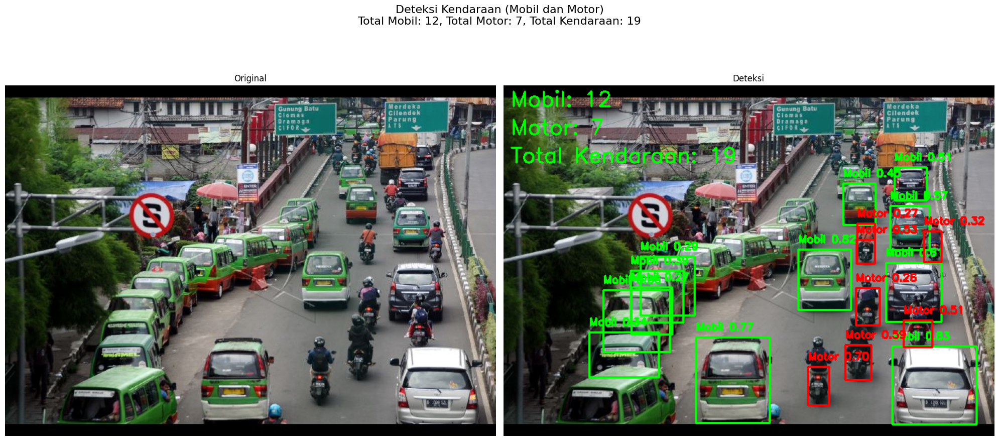


Hasil Deteksi:
Total Mobil: 12
Total Motor: 7
Total Kendaraan: 19


In [14]:
if __name__ == "__main__":
    # Image path
    image_path = '/content/drive/MyDrive/PCVK/Project/foto_mobil3.jpg'

    try:
        # Process detection
        original_image, annotated_image, total_cars, total_motorcycles = detect_vehicles(image_path)

        # Display results
        display_results(original_image, annotated_image, total_cars, total_motorcycles)

        # Print detection results
        print("\nHasil Deteksi:")
        print(f"Total Mobil: {total_cars}")
        print(f"Total Motor: {total_motorcycles}")
        print(f"Total Kendaraan: {total_cars + total_motorcycles}")

    except Exception as e:
        print(f"Error in processing the image: {str(e)}")


0: 640x640 1 person, 2 cars, 3 motorcycles, 253.0ms
Speed: 5.7ms preprocess, 253.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


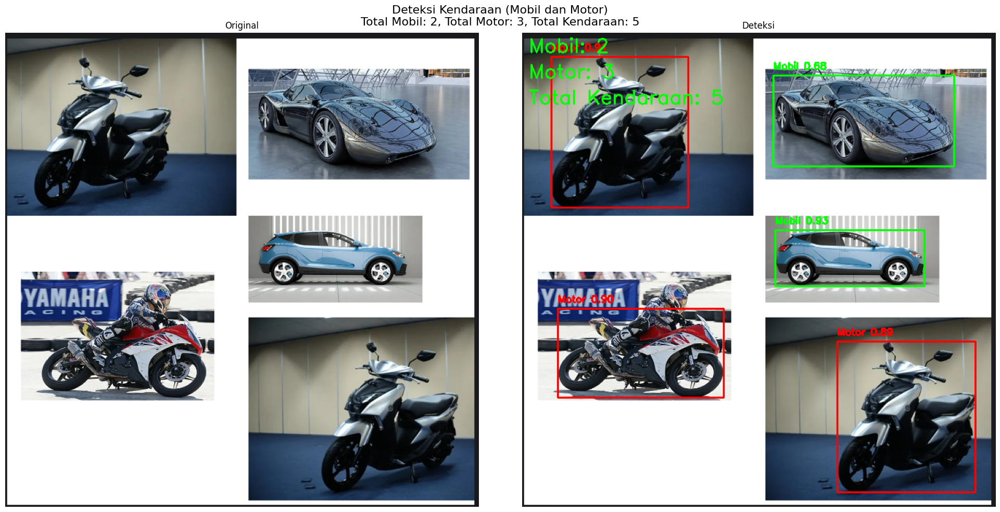


Hasil Deteksi:
Total Mobil: 2
Total Motor: 3
Total Kendaraan: 5


In [15]:
if __name__ == "__main__":
    # Image path
    image_path = '/content/drive/MyDrive/PCVK/Project/kendaraan.png'

    try:
        # Process detection
        original_image, annotated_image, total_cars, total_motorcycles = detect_vehicles(image_path)

        # Display results
        display_results(original_image, annotated_image, total_cars, total_motorcycles)

        # Print detection results
        print("\nHasil Deteksi:")
        print(f"Total Mobil: {total_cars}")
        print(f"Total Motor: {total_motorcycles}")
        print(f"Total Kendaraan: {total_cars + total_motorcycles}")

    except Exception as e:
        print(f"Error in processing the image: {str(e)}")


0: 480x640 15 cars, 1 bus, 2 trucks, 284.6ms
Speed: 5.6ms preprocess, 284.6ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


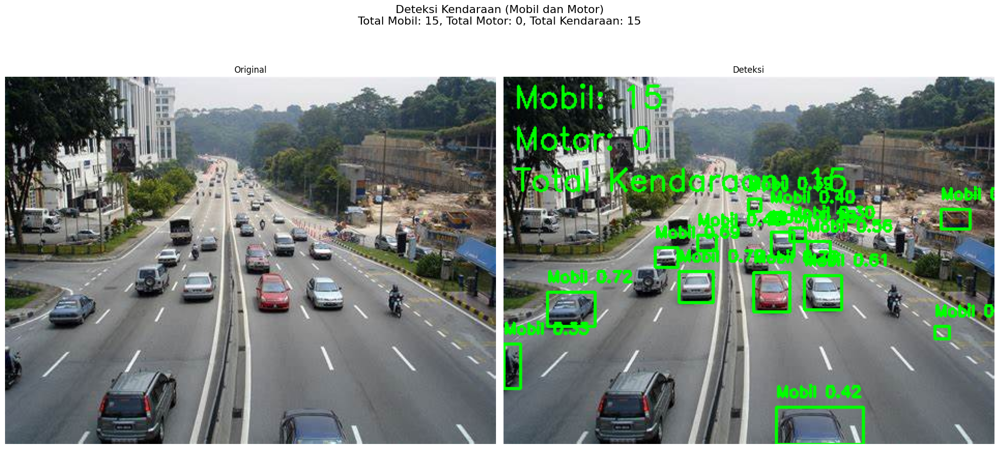


Hasil Deteksi:
Total Mobil: 15
Total Motor: 0
Total Kendaraan: 15


In [32]:
if __name__ == "__main__":
    # Image path
    image_path = '/content/drive/MyDrive/PCVK/Project/mobil_motor2.jpeg'

    try:
        # Process detection
        original_image, annotated_image, total_cars, total_motorcycles = detect_vehicles(image_path)

        # Display results
        display_results(original_image, annotated_image, total_cars, total_motorcycles)

        # Print detection results
        print("\nHasil Deteksi:")
        print(f"Total Mobil: {total_cars}")
        print(f"Total Motor: {total_motorcycles}")
        print(f"Total Kendaraan: {total_cars + total_motorcycles}")

    except Exception as e:
        print(f"Error in processing the image: {str(e)}")


0: 384x640 14 persons, 19 cars, 9 motorcycles, 3 trucks, 144.8ms
Speed: 4.6ms preprocess, 144.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


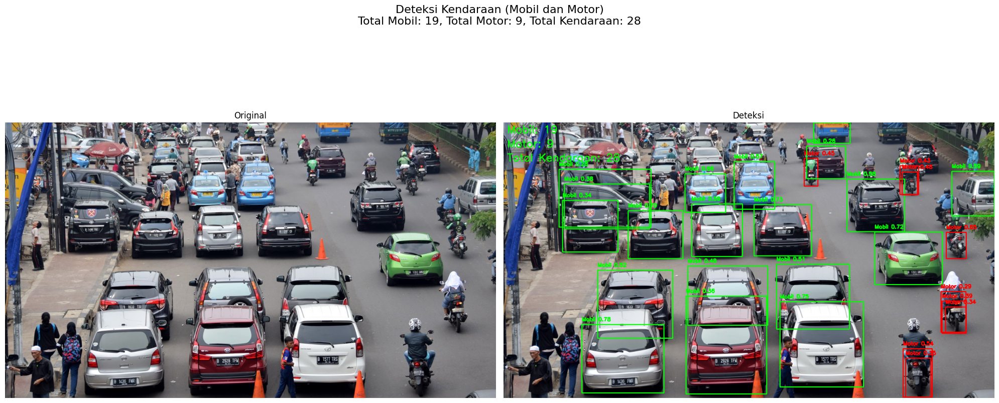


Hasil Deteksi:
Total Mobil: 19
Total Motor: 9
Total Kendaraan: 28


In [33]:
if __name__ == "__main__":
    # Image path
    image_path = '/content/drive/MyDrive/PCVK/Project/mobil_motor3.jpg'

    try:
        # Process detection
        original_image, annotated_image, total_cars, total_motorcycles = detect_vehicles(image_path)

        # Display results
        display_results(original_image, annotated_image, total_cars, total_motorcycles)

        # Print detection results
        print("\nHasil Deteksi:")
        print(f"Total Mobil: {total_cars}")
        print(f"Total Motor: {total_motorcycles}")
        print(f"Total Kendaraan: {total_cars + total_motorcycles}")

    except Exception as e:
        print(f"Error in processing the image: {str(e)}")